In [1]:
import osmnx as ox
import networkx as nx
import random
import math
import pandas as pd
import matplotlib.pyplot as plt          
import numpy as np
import seaborn as sns

In [35]:
def smooth(y,w=51,o=1,d=2):
    from scipy.signal import savgol_filter
    nans = [float('nan') for i in range(0,d)] 
    y = nans + list(savgol_filter(y[d:],w,o))
    for i in range(0,len(y)):
        if y[i]<0:
            y[i] = 0
    return y

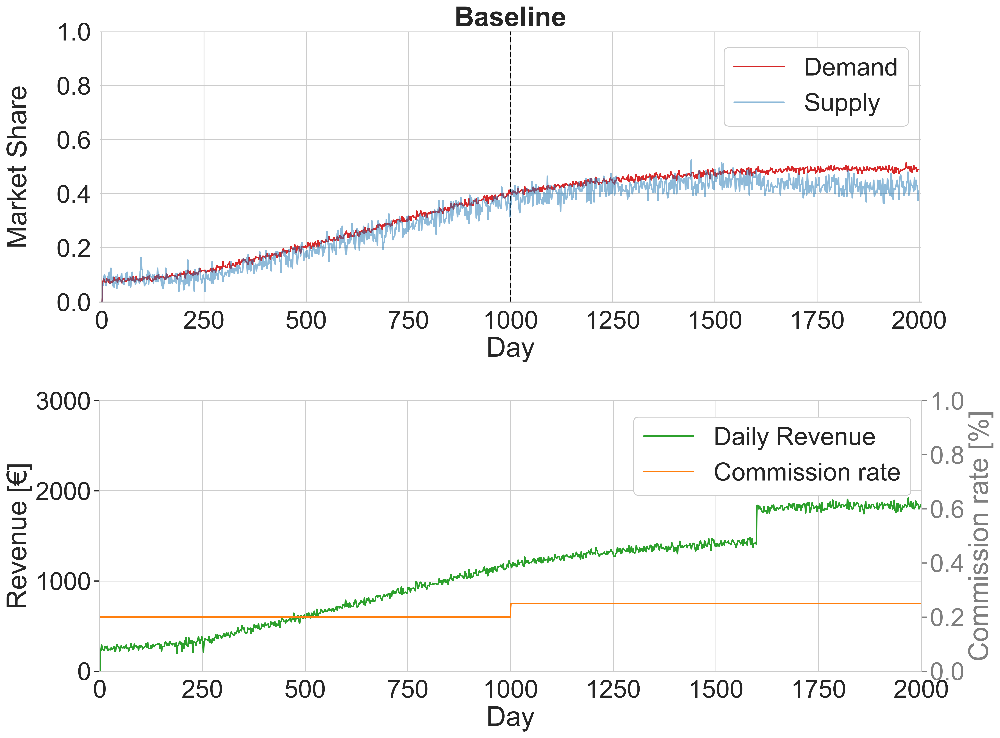

In [33]:
# Baseline plot

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2.5)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,12))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

db = pd.read_csv('csv/demand_run_baseline.csv')
sb = pd.read_csv('csv/supply_run_baseline.csv')
    
sns.lineplot(x=db.index , y=db.OUT/2000, label = 'Demand', color='C3', ax=ax[0])
sns.lineplot(x=sb.index , y=sb.OUT/200, label = 'Supply', color='C0', ax=ax[0], alpha=0.5)    

ax[0].vlines([1000], 0, 1, linestyles='dashed', colors='black')
# ax[0].grid(axis='x')
ax[0].set(xlabel='Day', ylabel='Market Share', ylim=(0,1),  xlim=(-5,2005))
ax[0].set_title('Baseline',fontweight='bold')
ax[0].legend(loc=(0.76,0.65),framealpha=1)

#------------------------------------------------
ax11 = ax[1].twinx()

sns.lineplot(x=db.index , y=db.plat_revenue, label = 'Daily Revenue', c='C2', ax=ax[1])
sns.lineplot(x=[0,1000, 1001, 2000] , y=[0.20,0.20, 0.25,0.25], label = 'Commission rate',c='C1', ax=ax11)

ax[1].set(xlabel='Day', ylabel='Revenue [€]', ylim=(0,3000),  xlim=(0,2000))
ax11.set(ylabel='Commission rate [%]', ylim=(0,1))

ax11.grid(b=None)
lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax11.get_legend_handles_labels()
ax[1].legend(lines + lines2, labels + labels2,framealpha=1, loc=(0.65,0.65))
ax11.legend().remove()
# ax[1].grid(axis='x')
ax11.tick_params(axis='y', colors='C7')
ax11.yaxis.label.set_color('C7')
# sns.despine(left=True)
# ax[1].set_title('(b)',fontweight='bold')

# for i in range(0,3):
#     value = ['I','II','III']
#     coords = [(300,1.05),(750,1.05),(950,1.05)]
#     ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
# plt.yticks([0,1])
fig.align_ylabels()

plt.tight_layout()
# plt.savefig('Fig2.png')

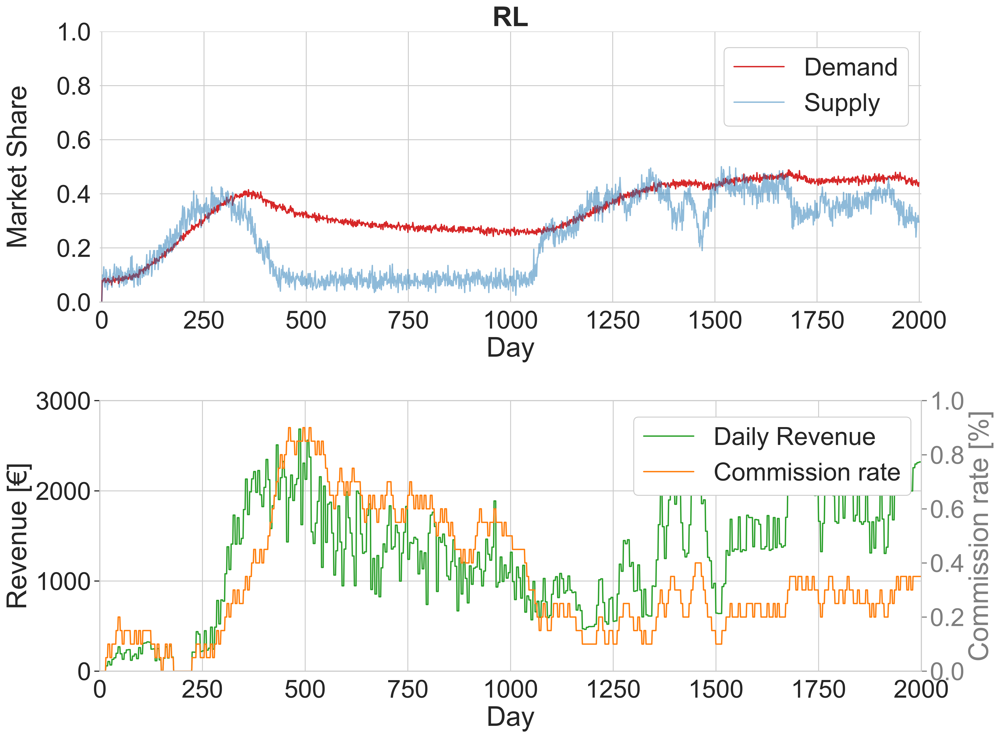

In [34]:
# RL plot

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2.5)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,12))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

run_id = 15
rl = pd.read_csv('csv/rl_run_{}.csv'.format(run_id))
d = pd.read_csv('csv/demand_run_{}.csv'.format(run_id))
s = pd.read_csv('csv/supply_run_{}.csv'.format(run_id))
    
sns.lineplot(x=d.index , y=d.OUT/2000, label = 'Demand', color='C3', ax=ax[0])
sns.lineplot(x=s.index , y=s.OUT/200, label = 'Supply', color='C0', ax=ax[0], alpha=0.5)    

# ax[0].vlines([1000], 0, 1, linestyles='dashed', colors='black')
# ax[0].grid(axis='x')
ax[0].set(xlabel='Day', ylabel='Market Share', ylim=(0,1),  xlim=(-5,2005))
ax[0].set_title('RL',fontweight='bold')
ax[0].legend(loc=(0.76,0.65),framealpha=1)

#------------------------------------------------
ax11 = ax[1].twinx()

sns.lineplot(x=rl.index , y=rl.revenue, label = 'Daily Revenue', c='C2', ax=ax[1])
sns.lineplot(x=rl.index , y=rl.comm_rate, label = 'Commission rate',c='C1', ax=ax11)

ax[1].set(xlabel='Day', ylabel='Revenue [€]', ylim=(0,3000),  xlim=(0,2000))
ax11.set(ylabel='Commission rate [%]', ylim=(0,1))

ax11.grid(b=None)
lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax11.get_legend_handles_labels()
ax[1].legend(lines + lines2, labels + labels2,framealpha=1, loc=(0.65,0.65))
ax11.legend().remove()
# ax[1].grid(axis='x')
ax11.tick_params(axis='y', colors='C7')
ax11.yaxis.label.set_color('C7')
# sns.despine(left=True)
# ax[1].set_title('(b)',fontweight='bold')

# for i in range(0,3):
#     value = ['I','II','III']
#     coords = [(300,1.05),(750,1.05),(950,1.05)]
#     ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
# plt.yticks([0,1])
fig.align_ylabels()

plt.tight_layout()
# plt.savefig('Fig2.png')

In [101]:
run_id = 15
rl = pd.read_csv('csv/rl_run_{}.csv'.format(run_id))
d = pd.read_csv('csv/demand_run_{}.csv'.format(run_id))
s = pd.read_csv('csv/supply_run_{}.csv'.format(run_id))

db = pd.read_csv('csv/demand_run_BL.csv')
sb = pd.read_csv('csv/supply_run_BL.csv')

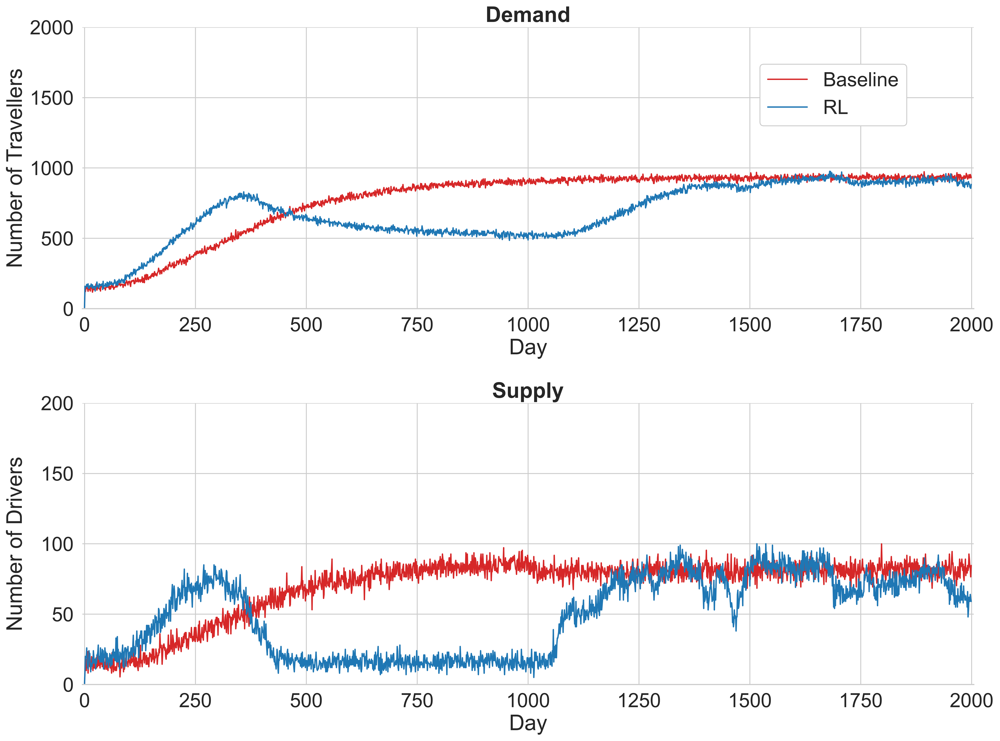

In [136]:
# Demand and Supply participation

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,12))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)
    
sns.lineplot(x=db.index , y=db.OUT, label = 'Baseline', color='C3', ax=ax[0])
sns.lineplot(x=d.index , y=d.OUT, label = 'RL', color='C0', ax=ax[0])

# ax[0].vlines([1000], 0, 1, linestyles='dashed', colors='black')
# ax[0].grid(axis='x')
ax[0].set(xlabel='Day', ylabel='Number of Travellers', ylim=(0,2000),  xlim=(-5,2005))
ax[0].set_title('Demand',fontweight='bold')
ax[0].legend(loc=(0.76,0.65),framealpha=1)
#-----------------------------------------------------------------------------------------
sns.lineplot(x=sb.index , y=sb.OUT, label = 'Baseline', color='C3', ax=ax[1])
sns.lineplot(x=s.index , y=s.OUT, label = 'RL', color='C0', ax=ax[1])

ax[1].set(xlabel='Day', ylabel='Number of Drivers', ylim=(0,200),  xlim=(-5,2005))
ax[1].set_title('Supply',fontweight='bold')
# ax[1].legend(loc=(0.76,0.65),framealpha=1)
ax[1].get_legend().set_visible(False)

fig.align_ylabels()
plt.tight_layout()
plt.savefig('Figs/itsc_Fig1.png')

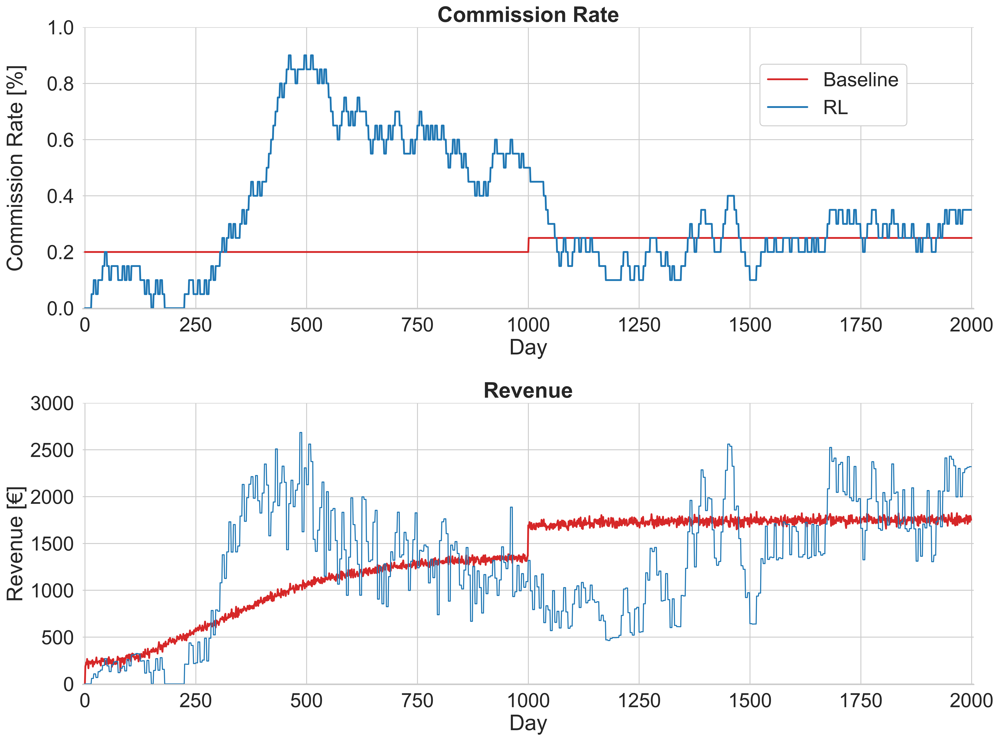

In [137]:
# Commission rate and Revenue

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,12))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

sns.lineplot(x=[0,1000, 1001, 2000] , y=[0.20,0.20, 0.25,0.25], label = 'Baseline', color='C3', lw=2, ax=ax[0])
sns.lineplot(x=rl.index , y=rl.comm_rate, label = 'RL', color='C0', lw=2, ax=ax[0])

ax[0].set(xlabel='Day', ylabel='Commission Rate [%]', ylim=(-0.002,1),  xlim=(-5,2005))
ax[0].set_title('Commission Rate',fontweight='bold')
ax[0].legend(loc=(0.76,0.65),framealpha=1)
#--------------------------------------------------------------------------------------
sns.lineplot(x=db.index , y=db.plat_revenue, label = 'Baseline', color='C3', lw=2, ax=ax[1])
sns.lineplot(x=rl.index , y=rl.revenue, label = 'RL', color='C0', lw=1.2, ax=ax[1])

# sns.lineplot(x=db.index , y=db.plat_revenue.cumsum(), label = 'Baseline', color='C3', lw=2, ax=ax[1])
# sns.lineplot(x=rl.index , y=rl.revenue.cumsum(), label = 'RL', color='C0', lw=1, ax=ax[1])

ax[1].set(xlabel='Day', ylabel='Revenue [€]', ylim=(-6,3000),  xlim=(-5,2005))
ax[1].set_title('Revenue',fontweight='bold')
# ax[1].legend(loc=(0.76,0.65),framealpha=1)
ax[1].get_legend().set_visible(False)

fig.align_ylabels()
plt.tight_layout()
plt.savefig('Figs/itsc_Fig2.png')

In [114]:
db.plat_revenue[1900:2000].mean()

1753.405893

In [115]:
rl.revenue[1900:2000].mean()

2053.2812409999997

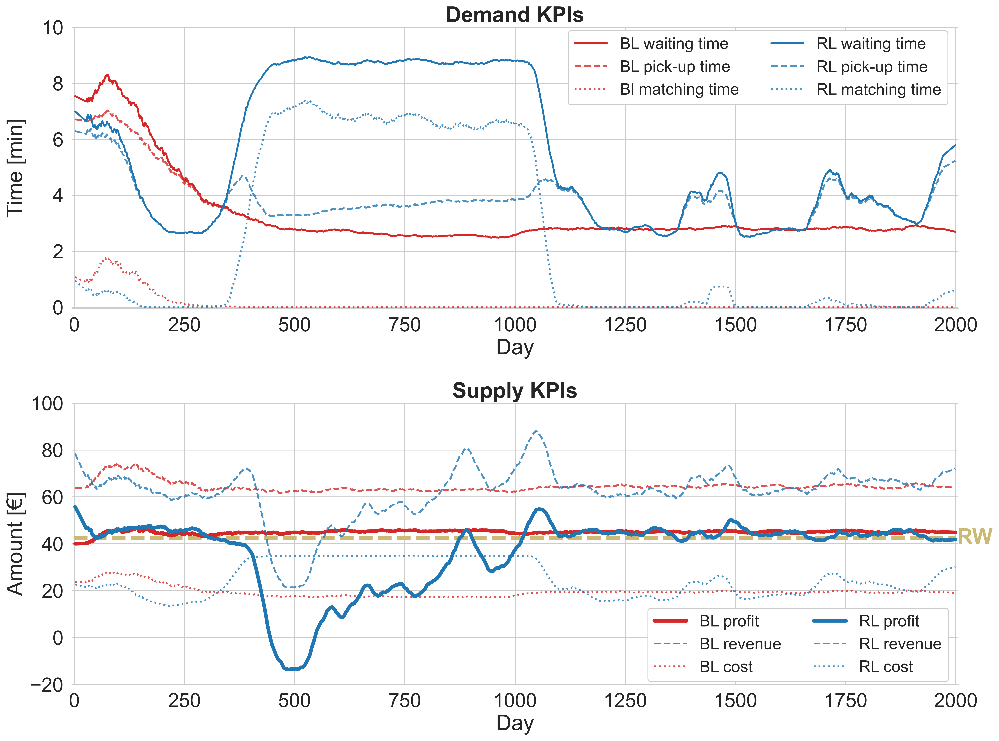

In [138]:
# Demand and Supply participation

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,12))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

alpha=0.8
sns.lineplot(x=db.index , y=smooth(db.ACTUAL_WT), label = 'BL waiting time', color='C3', lw=2, ax=ax[0])
sns.lineplot(x=db.index , y=smooth(sb.ARRIVES_AT_PICKUP/(sb.nRIDES*60)), label = 'BL pick-up time', color='C3', lw=2, linestyle = 'dashed',alpha=alpha, ax=ax[0])
sns.lineplot(x=db.index , y=smooth(db.MATCHING_T), label = 'Bl matching time', color='C3', lw=2,linestyle = 'dotted',alpha=alpha, ax=ax[0])

sns.lineplot(x=d.index , y=smooth(d.ACTUAL_WT), label = 'RL waiting time', color='C0', lw=2, ax=ax[0])
sns.lineplot(x=d.index , y=smooth(s.ARRIVES_AT_PICKUP/(s.nRIDES*60)), label = 'RL pick-up time', color='C0', lw=2, linestyle = 'dashed',alpha=alpha, ax=ax[0])
sns.lineplot(x=d.index , y=smooth(d.MATCHING_T), label = 'RL matching time', color='C0', lw=2,linestyle = 'dotted',alpha=alpha, ax=ax[0])

ax[0].set(xlabel='Day', ylabel='Time [min]', ylim=(-0.05,10),  xlim=(-5,2005))
ax[0].set_title('Demand KPIs',fontweight='bold')
ax[0].legend(loc=(0.56,0.725),framealpha=1, ncol=2, fancybox=True, fontsize=18)

#-------------
sns.lineplot(x=db.index , y=smooth(sb.ACTUAL_INC), label = 'BL profit', color='C3', lw=4, ax=ax[1])
sns.lineplot(x=db.index , y=smooth(sb.REVENUE), label = 'BL revenue', color='C3', lw=2, linestyle = 'dashed',alpha=alpha, ax=ax[1])
sns.lineplot(x=db.index , y=smooth(sb.COST), label = 'BL cost', color='C3', lw=2, linestyle = 'dotted',alpha=alpha, ax=ax[1])

profit = [a - b for a, b in zip(smooth(s.REVENUE), smooth(s.COST))]
sns.lineplot(x=d.index , y=profit, label = 'RL profit', color='C0', lw=4, ax=ax[1])
sns.lineplot(x=d.index , y=smooth(s.REVENUE), label = 'RL revenue', color='C0', lw=2,linestyle = 'dashed',alpha=alpha, ax=ax[1])
sns.lineplot(x=d.index , y=smooth(s.COST), label = 'RL cost', color='C0', lw=2, linestyle = 'dotted',alpha=alpha, ax=ax[1])

rw = 4*10.63
ax[1].hlines([rw], 0, 2000, linestyles='dashed', colors='y', lw=4)
ax[1].annotate('RW', xy =(2000+3,40), fontweight='bold', color='y') 

ax[1].set(xlabel='Day', ylabel='Amount [€]', ylim=(-20,100),  xlim=(-5,2005))
ax[1].set_title('Supply KPIs',fontweight='bold')
ax[1].legend(loc=(0.65,0.01),framealpha=1, ncol=2, fancybox=True, fontsize=18)

fig.align_ylabels()
plt.tight_layout()
plt.savefig('Figs/itsc_Fig3.png')